# Data Exploration

In [1]:
from google.colab import drive
drive.mount('/content/drive')
import pandas as pd
from google.colab import files
import numpy as np
!pip install geopandas
import geopandas as gpd
import matplotlib
import matplotlib.pyplot as plt
!pip install pillow
from PIL import Image, ImageFile
from IPython.display import Image as IMG
import plotly.express as px

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 15.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 9.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
gdf_countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
gdf_countries

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."
...,...,...,...,...,...,...
172,6944975.0,Europe,Serbia,SRB,51475,"POLYGON ((18.82982 45.90887, 18.82984 45.90888..."
173,622137.0,Europe,Montenegro,MNE,5542,"POLYGON ((20.07070 42.58863, 19.80161 42.50009..."
174,1794248.0,Europe,Kosovo,-99,7926,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,1394973.0,North America,Trinidad and Tobago,TTO,24269,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."


## Single Variable Analysis

### Emissions

In [3]:
emissions = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/\
Final Project/Processed Data/Country Emissions by Year", index_col=0)
emissions

,Entity,Code,Annual CO₂ emissions_1750,Annual CO₂ emissions_1751,Annual CO₂ emissions_1752,Annual CO₂ emissions_1753,Annual CO₂ emissions_1754,Annual CO₂ emissions_1755,Annual CO₂ emissions_1756,Annual CO₂ emissions_1757,...,Annual CO₂ emissions_2012,Annual CO₂ emissions_2013,Annual CO₂ emissions_2014,Annual CO₂ emissions_2015,Annual CO₂ emissions_2016,Annual CO₂ emissions_2017,Annual CO₂ emissions_2018,Annual CO₂ emissions_2019,Annual CO₂ emissions_2020,Annual CO₂ emissions_2021
0,Andorra,AND,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,487312.0,476320.0,461664.0,465328.0,468992.0,465328.0,494640.0,479984.0,448884.0,452888.0
1,Australia,AUS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,406150900.0,397887460.0,393952900.0,401793060.0,411264300.0,414358300.0,416283800.0,416356600.0,399922100.0,391187420.0
2,Brunei,BRN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9499821.0,7626062.0,8830987.0,6933294.0,7632904.0,9309383.0,9344423.0,10487509.0,10553166.0,10480519.0
3,Cambodia,KHM,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5576016.0,5636730.0,6834254.0,8365610.0,10921712.0,12504842.0,14388181.0,18024642.0,18703284.0,19028598.0
4,Cote d'Ivoire,CIV,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8540010.0,9679770.0,9903224.0,9554741.0,11982756.0,12001913.0,10352442.0,10535084.0,10963848.0,11706642.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218,Wallis and Futuna,WLF,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,25648.0,21984.0,21984.0,21984.0,25648.0,25648.0,25648.0,25648.0,27069.0,27818.0
219,Marshall Islands,MHL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,135568.0,139232.0,142896.0,142896.0,142896.0,146560.0,146560.0,146560.0,154682.0,158962.0
220,Micronesia (country),FSM,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,124576.0,135568.0,135568.0,142896.0,142896.0,142896.0,142896.0,146560.0,154682.0,158962.0
221,Timor,TLS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,571584.0,531280.0,567920.0,549600.0,589904.0,633872.0,633872.0,685168.0,718671.0,736328.0


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

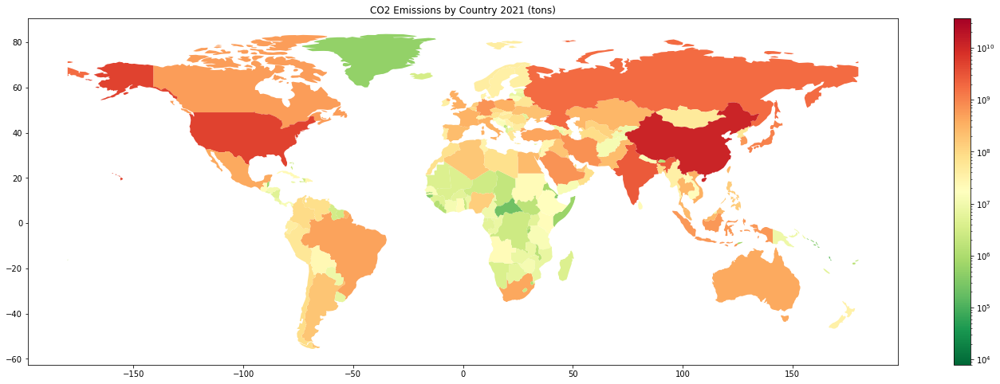

In [4]:
ems = emissions[["Code", "Annual CO₂ emissions_2021"]].rename(
    columns={"Code":"iso_a3", "Annual CO₂ emissions_2021":"CO2 Emissions"}
)
gdf_ems = gdf_countries.merge(ems, on=("iso_a3"), how="inner")
plot = gdf_ems[gdf_ems["name"] != "Antarctica"].plot(
    column="CO2 Emissions", figsize=(25, 8), cmap="RdYlGn_r", legend=True,
    norm=matplotlib.colors.LogNorm(
        vmin=ems[ems["CO2 Emissions"] != 0]["CO2 Emissions"].min(),
        vmax=ems["CO2 Emissions"].max()))
plt.title("CO2 Emissions by Country 2021 (tons)")
plt.savefig("CO2_Emissions_by_Country_2021.png")
files.download("CO2_Emissions_by_Country_2021.png")

In [5]:
px.histogram(gdf_ems["CO2 Emissions"], nbins=200, marginal='rug', 
             labels={"value":"CO2 Emissions (tons)"}, 
             title="Histogram of CO2 Emissions")

In [6]:
px.histogram(np.log10(gdf_ems["CO2 Emissions"]), nbins=20, 
             labels={"value":"CO2 Emissions (log10 scale tons)"}, 
             title="Histogram of CO2 Emissions")

/usr/local/lib/python3.9/dist-packages/pandas/core/arraylike.py:397: RuntimeWarning:

divide by zero encountered in log10



In [7]:
gdf_ems["CO2 Emissions"].describe()

count    1.710000e+02
mean     2.102999e+08
std      9.869335e+08
min      0.000000e+00
25%      5.548892e+06
50%      2.032710e+07
75%      8.857515e+07
max      1.147237e+10
Name: CO2 Emissions, dtype: float64

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

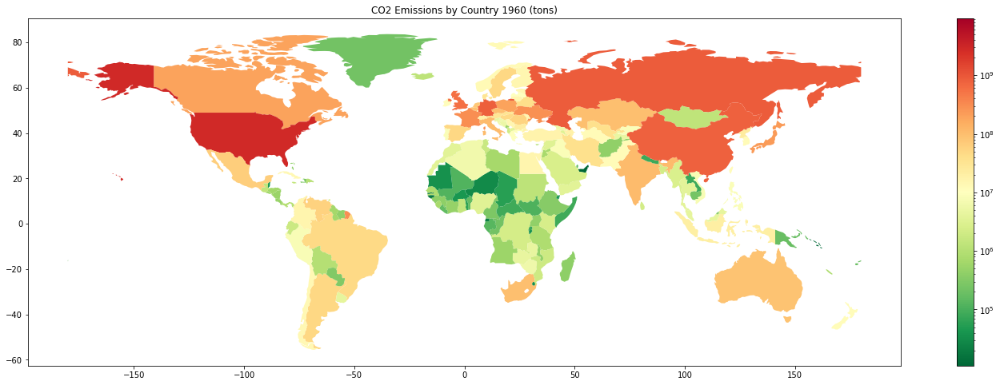

In [8]:
ems_1 = emissions[["Code", "Annual CO₂ emissions_1960"]].rename(
    columns={"Code":"iso_a3", "Annual CO₂ emissions_1960":"CO2 Emissions"}
)
gdf_ems_1 = gdf_countries.merge(ems_1, on=("iso_a3"), how="inner")
plot = gdf_ems_1[gdf_ems_1["name"] != "Antarctica"].plot(
    column="CO2 Emissions", figsize=(25, 8), cmap="RdYlGn_r", legend=True,
    norm=matplotlib.colors.LogNorm(
        vmin=ems_1[ems_1["CO2 Emissions"] != 0]["CO2 Emissions"].min(),
        vmax=ems_1["CO2 Emissions"].max()))
plt.title("CO2 Emissions by Country 1960 (tons)")
plt.savefig("CO2_Emissions_by_Country_1960.png")
files.download("CO2_Emissions_by_Country_1960.png")

In [ ]:
emissions = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/\
Final Project/Processed Data/Country Emissions by Year", index_col=0)
ims = []
for i in range(1750, 2022):
  ems = emissions[["Code", "Annual CO₂ emissions_" + str(i)]].rename(
      columns={"Code":"iso_a3", "Annual CO₂ emissions_" + str(i):"CO2 Emissions"}
  )
  ems.replace(0.0, np.nan, inplace=True)
  gdf_ems = gdf_countries.merge(ems, on=("iso_a3"), how="inner")
  plot = gdf_ems[gdf_ems["name"] != "Antarctica"].plot(
      column="CO2 Emissions", figsize=(25, 8), cmap="RdYlGn_r", legend=True,
      norm=matplotlib.colors.LogNorm(vmin=1, vmax=37123850000), 
      missing_kwds={"color":"gray", "aspect":"equal"})
  plt.title("CO2 Emissions by Country " + str(i) + " (tons)")
  plt.gca().set_aspect('equal')
  plt.savefig("CO2_Emissions_by_Country_" + str(i) + ".png")
  Image.open("CO2_Emissions_by_Country_" + str(i) + ".png").convert(
      "RGB").save("CO2_Emissions_by_Country_" + str(i) + ".jpg",'JPEG')
  ims.append(Image.open("CO2_Emissions_by_Country_" + str(i) + ".jpg"))

In [ ]:
ims[0].save("emissions.gif", format="GIF", append_images=ims,
               save_all=True, duration=100, loop=0)
files.download("emissions.gif")
IMG(open('emissions.gif','rb').read())

### Urban Population Percentage

In [ ]:
urban = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final P\
roject/Processed Data/Country Urban Population Percentage by Year", index_col=0)
urb = urban[["Location", "1960"]].rename(
    columns={"Location":"name", "1960":"Urban Population Percentage"}
)
urb["name"] = urb["name"].str.strip()
gdf_urb = gdf_countries.merge(urb, on=("name"), how="left")
plot = gdf_urb[gdf_urb["name"] != "Antarctica"].plot(
    column="Urban Population Percentage", figsize=(25, 8), cmap="Blues", 
    legend=True, missing_kwds={'color': 'gray'})
plt.title("Urban Population Percentage by Country 1960")
plt.savefig("Urban_Population_Percentage_1960.png")
files.download("Urban_Population_Percentage_1960.png")

In [ ]:
urban = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final P\
roject/Processed Data/Country Urban Population Percentage by Year", index_col=0)
urb = urban[["Location", "2021"]].rename(
    columns={"Location":"name", "2021":"Urban Population Percentage"}
)
urb["name"] = urb["name"].str.strip()
gdf_urb = gdf_countries.merge(urb, on=("name"), how="left")
plot = gdf_urb[gdf_urb["name"] != "Antarctica"].plot(
    column="Urban Population Percentage", figsize=(25, 8), cmap="Blues", 
    legend=True, missing_kwds={'color': 'gray'})
plt.title("Urban Population Percentage by Country 2021")
plt.savefig("Urban_Population_Percentage_2021.png")
files.download("Urban_Population_Percentage_2021.png")

In [ ]:
ims = []
urban = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final P\
roject/Processed Data/Country Urban Population Percentage by Year", index_col=0)
for i in range(1960, 2022):
  urb = urban[["Location", str(i)]].rename(
      columns={"Location":"name", str(i):"Urban Population Percentage"}
  )
  urb["name"] = urb["name"].str.strip()
  gdf_urb = gdf_countries.merge(urb, on=("name"), how="left")
  plot = gdf_urb[gdf_urb["name"] != "Antarctica"].plot(
      column="Urban Population Percentage", figsize=(25, 8), cmap="Blues", 
      legend=True, missing_kwds={'color': 'gray'})
  plt.title("Urban Population Percentage by Country " + str(i))
  plt.savefig("Urban_Population_Percentage_" + str(i) + ".png")
  Image.open("Urban_Population_Percentage_" + str(i) + ".png").convert(
      "RGB").save("Urban_Population_Percentage_" + str(i) + ".jpg",'JPEG')
  ims.append(Image.open("Urban_Population_Percentage_" + str(i) + ".jpg"))

In [ ]:
ims[0].save("urban.gif", format="GIF", append_images=ims,
               save_all=True, duration=100, loop=0)
files.download("urban.gif")
IMG(open('urban.gif','rb').read())

### Population

In [ ]:
population = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/\
Final Project/Processed Data/Country Population by Year", index_col=0)
ims = []
for i in range(1960, 2022):
  pop = population[["Location", str(i)]].rename(
      columns={"Location":"name", str(i):"Population"})
  pop.replace(0.0, np.nan, inplace=True)
  pop["name"] = pop["name"].str.strip()
  gdf_pop = gdf_countries.merge(pop, on=("name"), how="left")
  plot = gdf_pop[gdf_pop["name"] != "Antarctica"].plot(
      column="Population", figsize=(25, 8), cmap="RdYlGn_r", legend=True,
      norm=matplotlib.colors.LogNorm(vmin=1, vmax=1500000), 
      missing_kwds={"color":"gray", "aspect":"equal"})
  plt.title("Population by Country in " + str(i) + " (Thousands)")
  plt.gca().set_aspect('equal')
  plt.savefig("Population_by_Country_" + str(i) + ".png")
  Image.open("Population_by_Country_" + str(i) + ".png").convert(
      "RGB").save("Population_by_Country_" + str(i) + ".jpg",'JPEG')
  ims.append(Image.open("Population_by_Country_" + str(i) + ".jpg"))
ims[0].save("population.gif", format="GIF", append_images=ims,
               save_all=True, duration=100, loop=0)
files.download("population.gif")

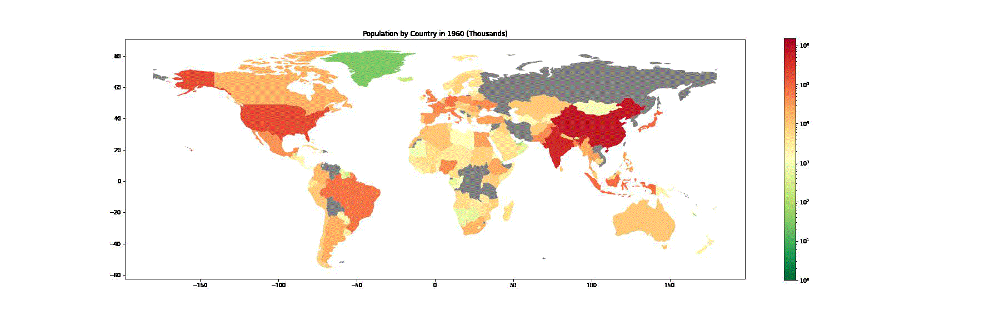

In [16]:
IMG(open('population.gif','rb').read())

### GDP Per Capita

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final \
Project/Processed Data/Country GDP per Capita by Year", index_col=0)
metric = "GDP Per Capita"
scale = "(USD)"
ims = []
for i in range(1960, 2022):
  sdf = df[["Country Code", str(i)]].rename(
      columns={"Country Code":"iso_a3", str(i):metric})
  sdf.replace(0.0, np.nan, inplace=True)
  mdf = gdf_countries.merge(sdf, on=("iso_a3"), how="left")
  plot = mdf[mdf["name"] != "Antarctica"].plot(
      column=metric, figsize=(25, 8), cmap="RdYlGn_r", legend=True,
      norm=matplotlib.colors.LogNorm(vmin=10, vmax=250000), 
      missing_kwds={"color":"gray", "aspect":"equal"})
  plt.title(metric + " by Country in " + str(i) + " " + scale)
  plt.gca().set_aspect('equal')
  path = metric.replace(" ", "_") + str(i)
  plt.savefig(path + ".png")
  Image.open(path + ".png").convert(
      "RGB").save(path + ".jpg",'JPEG')
  ims.append(Image.open(path + ".jpg"))
ims[0].save(metric + ".gif", format="GIF", append_images=ims,
               save_all=True, duration=100, loop=0)
files.download(metric + ".gif")

In [ ]:
IMG(open(metric + '.gif','rb').read())

### Energy Sectors

In [ ]:
paths = [
"/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final Project/Processed \
Data/Country biofuel_share_energy by Year", 
"/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final Project/Processed \
Data/Country coal_share_energy by Year", 
"/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final Project/Processed \
Data/Country fossil_share_energy by Year", 
"/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final Project/Processed \
Data/Country gas_share_energy by Year",
"/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final Project/Processed \
Data/Country low_carbon_share_energy by Year",
"/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final Project/Processed \
Data/Country oil_share_energy by Year"
]
metrics = ["Biofuel Share", "Coal Share", "Fossil Fuel Share", "Gas Share", 
           "Low Carbon Share", "Oil Share"]

In [ ]:
for j in range(6):
  df = pd.read_csv(paths[j], index_col=0)
  metric = metrics[j]
  ims = []
  for i in range(1960, 2021):
    sdf = df[["iso_code", paths[j].split()[-3] + "_" + str(i)]].rename(
        columns={"iso_code":"iso_a3", 
                 paths[j].split(" ")[-3] + "_" + str(i):metric})
    mdf = gdf_countries.merge(sdf, on=("iso_a3"), how="left")
    plot = mdf[mdf["name"] != "Antarctica"].plot(
        column=metric, figsize=(25, 8), cmap="Reds", legend=True,
        vmin=0, vmax=100, missing_kwds={"color":"gray", "aspect":"equal"})
    plt.title(metric + " by Country in " + str(i) + " " + scale)
    plt.gca().set_aspect('equal')
    path = metric.replace(" ", "_") + str(i)
    plt.savefig(path + ".png")
    Image.open(path + ".png").convert(
        "RGB").save(path + ".jpg",'JPEG')
    ims.append(Image.open(path + ".jpg"))
  ims[0].save(metric + ".gif", format="GIF", append_images=ims,
                save_all=True, duration=100, loop=0)
  files.download(metric + ".gif")

### Electrification

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final \
Project/Processed Data/Country Electrification by Year", index_col=0)
metric = "Electrification"
scale = ""
ims = []
for i in range(1990, 2021):
  sdf = df[["Country Code", str(i)]].rename(
      columns={"Country Code":"iso_a3", str(i):metric})
  sdf.replace(0.0, np.nan, inplace=True)
  mdf = gdf_countries.merge(sdf, on=("iso_a3"), how="left")
  plot = mdf[mdf["name"] != "Antarctica"].plot(
      column=metric, figsize=(25, 8), cmap="RdYlGn_r", legend=True,
      vmin=0, vmax=100, missing_kwds={"color":"gray", "aspect":"equal"})
  plt.title(metric + " by Country in " + str(i) + " " + scale)
  plt.gca().set_aspect('equal')
  path = metric.replace(" ", "_") + str(i)
  plt.savefig(path + ".png")
  Image.open(path + ".png").convert(
      "RGB").save(path + ".jpg",'JPEG')
  ims.append(Image.open(path + ".jpg"))
ims[0].save(metric + ".gif", format="GIF", append_images=ims,
               save_all=True, duration=200, loop=0)
files.download(metric + ".gif")

In [ ]:
IMG(open(metric + '.gif','rb').read())

### Foreign Direct Investment

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final \
Project/Processed Data/Country FDI by Year.csv", index_col=0)
metric = "Foreign Direct Investment"
scale = "(USD)"
ims = []
for i in range(1970, 2022):
  sdf = df[["Country Code", str(i)]].rename(
    columns={"Country Code":"iso_a3", str(i):metric})
  sdf.replace(0.0, np.nan, inplace=True)
  sdf[sdf[metric] <= 0] = np.nan
  mdf = gdf_countries.merge(sdf, on=("iso_a3"), how="left")
  plot = mdf[mdf["name"] != "Antarctica"].plot(
      column=metric, figsize=(25, 8), cmap="PiYG", legend=True,
      norm=matplotlib.colors.LogNorm(vmin=1, vmax=300000000000),
      missing_kwds={"color":"gray", "aspect":"equal"})
  plt.title(metric + " by Country in " + str(i) + " " + scale)
  plt.gca().set_aspect('equal')
  path = metric.replace(" ", "_") + str(i)
  plt.savefig(path + ".png")
  Image.open(path + ".png").convert(
      "RGB").save(path + ".jpg",'JPEG')
  ims.append(Image.open(path + ".jpg"))
ims[0].save(metric + ".gif", format="GIF", append_images=ims,
               save_all=True, duration=200, loop=0)
files.download(metric + ".gif")

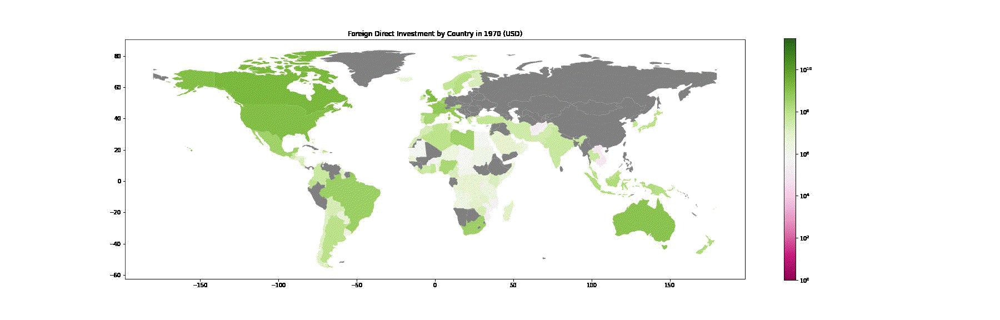

In [24]:
IMG(open(metric + '.gif','rb').read())

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final \
Project/Processed Data/Country FDI by Year.csv", index_col=0)
metric = "Foreign Direct Investment"
scale = "(USD)"
ims = []
for i in range(1970, 2022):
  sdf = df[["Country Code", str(i)]].rename(
    columns={"Country Code":"iso_a3", str(i):metric})
  sdf[metric] *= -1
  sdf.loc[sdf[metric] <= 0, metric] = np.nan
  mdf = gdf_countries.merge(sdf, on=("iso_a3"), how="left")
  plot = mdf[mdf["name"] != "Antarctica"].plot(
      column=metric, figsize=(25, 8), cmap="PiYG_r", legend=True,
      norm=matplotlib.colors.LogNorm(vmin=1, vmax=30000000000),
      missing_kwds={"color":"gray", "aspect":"equal"})
  plt.title(metric + " by Country in " + str(i) + " " + scale)
  plt.gca().set_aspect('equal')
  path = metric.replace(" ", "_") + str(i)
  plt.savefig(path + ".png")
  Image.open(path + ".png").convert(
      "RGB").save(path + ".jpg",'JPEG')
  ims.append(Image.open(path + ".jpg"))
ims[0].save(metric + ".gif", format="GIF", append_images=ims,
               save_all=True, duration=200, loop=0)
files.download(metric + ".gif")

In [ ]:
IMG(open(metric + '.gif','rb').read())

### Fortune Global 500

In [ ]:
fortune = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final \
Project/Processed Data/Fortune 500.csv", index_col=0)
fortune

In [ ]:
fort = pd.DataFrame(fortune.groupby(["Country", "Year"])["Company"].count())
fort

In [ ]:
fort.to_csv("All Fortune 500.csv")
files.download("All Fortune 500.csv")

In [ ]:
fort = fort.reset_index()
fort

In [31]:
cities = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final \
Project/worldcities.csv", index_col=0)

In [32]:
cities = cities.reset_index()

In [33]:
fort_city = pd.DataFrame(fortune.groupby(["City", "Year"])["Company"].count())

In [34]:
fortune_city = fortune[~(pd.isna(fortune['City']))]
cities = cities.rename(columns = {"country": "Country", "city" : "City"})
cities["Country"] = cities["Country"].replace(
    to_replace=['United States'], value=['United States of America'])

In [35]:
world_cities = cities[["City", "Country", "lat", "lng", "population"]]

In [36]:
fortune_city

,Company,Country,Revenue,Year,City
9685,Walmart,United States of America,48565100,2015,Bentonville
9686,Sinopec Group,China,44681100,2015,Beijing
9687,Royal Dutch Shell,Netherlands,43134400,2015,The Hague
9688,China National Petroleum,China,42862000,2015,Beijing
9689,Exxon Mobil,United States of America,38259700,2015,Irving
...,...,...,...,...,...
13681,DSV,Denmark,28988000000,2022,Hedehusene
13682,ABB,Switzerland,28945000000,2022,Zurich
13683,Mondelēz International,United States of America,28720000000,2022,Chicago
13684,Danone,France,28708000000,2022,Paris


In [37]:
#Removing cities with duplicate names within a country by population size (assuming
#a Global 500 country would be located in the larger of the two cities)
world_cities_sorted = world_cities.sort_values(by=["City", "population"])
df_cities = world_cities_sorted.drop_duplicates(subset=["City", "Country"], keep="last")

In [38]:
f500_locations = fortune_city.merge(df_cities, on=("City", "Country"), how="left", validate = "many_to_one")

In [39]:
f500_final = pd.DataFrame(f500_locations.groupby(["City", "Country", "lat", "lng", "Year"])["Company"].count())

In [40]:
f500_locations

,Company,Country,Revenue,Year,City,lat,lng,population
0,Walmart,United States of America,48565100,2015,Bentonville,36.3546,-94.2306,54909.0
1,Sinopec Group,China,44681100,2015,Beijing,39.9040,116.4075,19437000.0
2,Royal Dutch Shell,Netherlands,43134400,2015,The Hague,52.0800,4.3100,537833.0
3,China National Petroleum,China,42862000,2015,Beijing,39.9040,116.4075,19437000.0
4,Exxon Mobil,United States of America,38259700,2015,Irving,32.8584,-96.9702,239798.0
...,...,...,...,...,...,...,...,...
3981,DSV,Denmark,28988000000,2022,Hedehusene,NaN,NaN,NaN
3982,ABB,Switzerland,28945000000,2022,Zurich,NaN,NaN,NaN
3983,Mondelēz International,United States of America,28720000000,2022,Chicago,41.8373,-87.6862,8604203.0
3984,Danone,France,28708000000,2022,Paris,48.8566,2.3522,11027000.0


In [41]:
f500_final = f500_final.reset_index()

In [42]:
gdf_f500 = gpd.GeoDataFrame(
    f500_final,
    geometry=gpd.points_from_xy(f500_final["lng"],
                                f500_final["lat"])
).set_crs(gdf_countries.crs)
gdf_f500

,City,Country,lat,lng,Year,Company,geometry
0,Abu Dhabi,United Arab Emirates,24.4511,54.3969,2015,1,POINT (54.39690 24.45110)
1,Amsterdam,Netherlands,52.3667,4.8833,2015,4,POINT (4.88330 52.36670)
2,Amsterdam,Netherlands,52.3667,4.8833,2016,3,POINT (4.88330 52.36670)
3,Amsterdam,Netherlands,52.3667,4.8833,2017,5,POINT (4.88330 52.36670)
4,Amsterdam,Netherlands,52.3667,4.8833,2018,5,POINT (4.88330 52.36670)
...,...,...,...,...,...,...,...
1502,Zhuhai,China,22.2769,113.5678,2021,1,POINT (113.56780 22.27690)
1503,Zhuhai,China,22.2769,113.5678,2022,1,POINT (113.56780 22.27690)
1504,Zug,Switzerland,47.1681,8.5169,2016,1,POINT (8.51690 47.16810)
1505,Zug,Switzerland,47.1681,8.5169,2021,1,POINT (8.51690 47.16810)


In [43]:
gdf_f500_2022 = gdf_f500[gdf_f500["Year"]==2022]
gdf_f500_2022

,City,Country,lat,lng,Year,Company,geometry
8,Amsterdam,Netherlands,52.3667,4.8833,2022,3,POINT (4.88330 52.36670)
14,Anshan,China,41.1066,122.9895,2022,1,POINT (122.98950 41.10660)
22,Atlanta,United States of America,33.7627,-84.4224,2022,4,POINT (-84.42240 33.76270)
26,Aubervilliers,France,48.9131,2.3831,2022,1,POINT (2.38310 48.91310)
28,Austin,United States of America,30.3004,-97.7522,2022,2,POINT (-97.75220 30.30040)
...,...,...,...,...,...,...,...
1459,Xiamen,China,24.4797,118.0819,2022,3,POINT (118.08190 24.47970)
1480,Yokohama,Japan,35.4333,139.6333,2022,1,POINT (139.63330 35.43330)
1488,Zaandam,Netherlands,52.4417,4.8422,2022,1,POINT (4.84220 52.44170)
1503,Zhuhai,China,22.2769,113.5678,2022,1,POINT (113.56780 22.27690)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

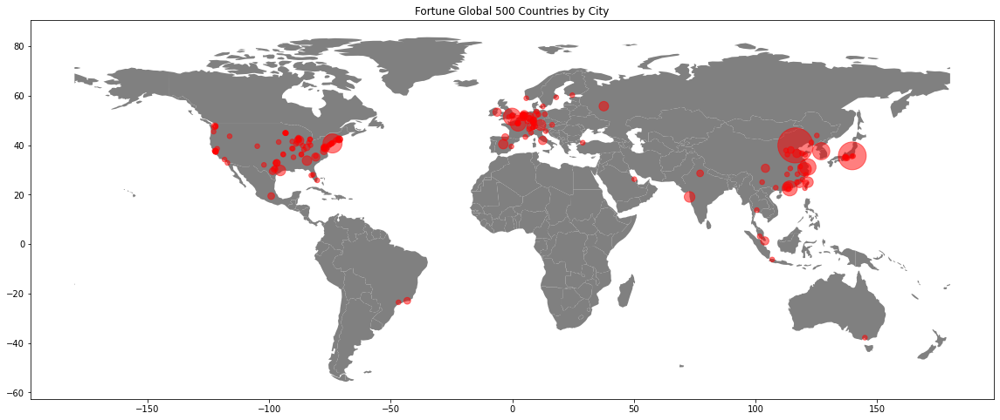

In [44]:
ax = gdf_countries[gdf_countries["name"] != "Antarctica"].plot(
    facecolor="gray", figsize=(25, 8))
gdf_f500_2022.plot(
    ax=ax, color="red", alpha=0.5,
    markersize= 30 * gdf_f500_2022["Company"])
plt.title("Fortune Global 500 Countries by City")
plt.savefig("F500 Dot Map.png")
files.download("F500 Dot Map.png")

## Multivariable Analysis

### Population

In [45]:
emissions = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/\
Final Project/Processed Data/Country Emissions by Year", index_col=0)
urban_pop = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/\
Final Project/Processed Data/Country Urban Population Percentage by Year",
index_col=0)
pop = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/\
Final Project/Processed Data/Country Population by Year", index_col=0)

In [46]:
cols = emissions.columns
ems = emissions
ems.columns = list(cols[:2]) + list(cols[2:].str[-4:].astype(int))
ems

,Entity,Code,1750,1751,1752,1753,1754,1755,1756,1757,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Andorra,AND,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,487312.0,476320.0,461664.0,465328.0,468992.0,465328.0,494640.0,479984.0,448884.0,452888.0
1,Australia,AUS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,406150900.0,397887460.0,393952900.0,401793060.0,411264300.0,414358300.0,416283800.0,416356600.0,399922100.0,391187420.0
2,Brunei,BRN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9499821.0,7626062.0,8830987.0,6933294.0,7632904.0,9309383.0,9344423.0,10487509.0,10553166.0,10480519.0
3,Cambodia,KHM,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5576016.0,5636730.0,6834254.0,8365610.0,10921712.0,12504842.0,14388181.0,18024642.0,18703284.0,19028598.0
4,Cote d'Ivoire,CIV,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8540010.0,9679770.0,9903224.0,9554741.0,11982756.0,12001913.0,10352442.0,10535084.0,10963848.0,11706642.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218,Wallis and Futuna,WLF,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,25648.0,21984.0,21984.0,21984.0,25648.0,25648.0,25648.0,25648.0,27069.0,27818.0
219,Marshall Islands,MHL,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,135568.0,139232.0,142896.0,142896.0,142896.0,146560.0,146560.0,146560.0,154682.0,158962.0
220,Micronesia (country),FSM,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,124576.0,135568.0,135568.0,142896.0,142896.0,142896.0,142896.0,146560.0,154682.0,158962.0
221,Timor,TLS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,571584.0,531280.0,567920.0,549600.0,589904.0,633872.0,633872.0,685168.0,718671.0,736328.0


In [47]:
data = []
for i in range(223):
  for j in range(2, 274):
    if ems.iloc[i, j] != 0:
      data.append((ems.iloc[i, 0], ems.iloc[i, 1], ems.columns[j], ems.iloc[i, j]))
df_emissions = pd.DataFrame(data, columns=["name", "code", "year", "emissions"])
df_emissions

,name,code,year,emissions
0,Andorra,AND,1990,406704.0
1,Andorra,AND,1991,406704.0
2,Andorra,AND,1992,406704.0
3,Andorra,AND,1993,410368.0
4,Andorra,AND,1994,406704.0
...,...,...,...,...
21519,Kosovo,OWID_KOS,2017,8093775.5
21520,Kosovo,OWID_KOS,2018,8148736.0
21521,Kosovo,OWID_KOS,2019,8496816.0
21522,Kosovo,OWID_KOS,2020,8521778.0


In [48]:
df_emissions.to_csv("All Ems.csv")
files.download("All Ems.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [49]:
urban_pop

,ISO 3166-1 numeric code,Location,1950,1951,1952,1953,1954,1955,1956,1957,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,900,World,29.6,30.0,30.4,30.8,31.2,31.6,32.1,32.5,...,53.0,53.5,53.9,54.4,54.8,55.3,55.7,56.2,56.6,57.0
1,901,More developed regions,54.8,55.4,56.0,56.6,57.3,57.9,58.6,59.2,...,77.8,78.0,78.1,78.3,78.5,78.7,78.9,79.1,79.3,79.5
2,902,Less developed regions,17.7,18.1,18.5,18.9,19.3,19.7,20.1,20.6,...,47.9,48.4,49.0,49.5,50.1,50.6,51.2,51.7,52.2,52.8
3,941,Least developed countries,7.5,7.7,7.9,8.1,8.3,8.5,8.7,9.0,...,31.0,31.5,32.0,32.5,33.0,33.6,34.1,34.6,35.2,35.7
4,934,"Less developed regions, excluding least ...",19.0,19.4,19.8,20.2,20.7,21.1,21.6,22.1,...,50.9,51.5,52.1,52.7,53.3,53.9,54.5,55.1,55.6,56.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268,882,Samoa,12.9,13.7,14.6,15.5,16.4,17.4,18.4,18.7,...,19.4,19.1,18.9,18.7,18.5,18.2,18.1,17.9,17.7,17.6
269,772,Tokelau,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
270,776,Tonga,12.9,13.4,13.9,14.4,14.9,15.5,16.1,16.5,...,23.4,23.3,23.3,23.2,23.2,23.1,23.1,23.1,23.1,23.1
271,798,Tuvalu,11.2,11.6,12.0,12.5,12.9,13.4,13.8,14.3,...,57.8,58.8,59.7,60.6,61.5,62.4,63.2,64.0,64.8,65.5


In [50]:
data = []
for i in range(273):
  for j in range(2, 75):
    if urban_pop.iloc[i, j] != 0:
      data.append((urban_pop.iloc[i, 1], urban_pop.columns[j],
                   urban_pop.iloc[i, j]))
df_urban_pop = pd.DataFrame(data, columns=["name", "year", 
                                           "urban population percentage"])
df_urban_pop["year"] = df_urban_pop["year"].astype(int)
df_urban_pop["name"] = df_urban_pop["name"].str.strip()
df_urban_pop

,name,year,urban population percentage
0,World,1950,29.6
1,World,1951,30.0
2,World,1952,30.4
3,World,1953,30.8
4,World,1954,31.2
...,...,...,...
19778,Tuvalu,2018,62.4
19779,Tuvalu,2019,63.2
19780,Tuvalu,2020,64.0
19781,Tuvalu,2021,64.8


In [51]:
df_urban_pop.to_csv("All Urban Pop.csv")
files.download("All Urban Pop.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [52]:
pop

,ISO 3166-1 numeric code,Location,1950,1951,1952,1953,1954,1955,1956,1957,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,900,World,2536275,2583817,2630584,2677230,2724302,2772243,2821383,2871952,...,7213426,7298453,7383009,7466964,7550262,7632819,7714577,7795482,7875465,7954469
1,901,More developed regions,814865,824213,834074,844264,854632,865069,875507,885914,...,1246520,1249864,1253207,1256576,1259922,1263200,1266335,1269277,1272013,1274563
2,902,Less developed regions,1721410,1759604,1796510,1832967,1869671,1907173,1945876,1986038,...,5966906,6048590,6129802,6210388,6290340,6369620,6448242,6526205,6603452,6679906
3,941,Least developed countries,195259,199052,202905,206885,211045,215421,220033,224885,...,912094,934192,956631,979388,1002486,1025937,1049765,1073984,1098591,1123563
4,934,"Less developed regions, excluding least ...",1526151,1560552,1593605,1626082,1658626,1691752,1725843,1761153,...,5054812,5114397,5173171,5231000,5287854,5343683,5398477,5452221,5504861,5556343
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268,882,Samoa,82,84,87,89,92,94,97,100,...,191,192,194,195,196,198,199,200,201,203
269,772,Tokelau,2,2,2,2,2,2,2,2,...,1,1,1,1,1,1,1,1,1,1
270,776,Tonga,47,49,51,53,54,55,56,57,...,105,106,106,107,108,109,110,111,112,113
271,798,Tuvalu,5,5,5,5,5,6,6,6,...,11,11,11,11,11,11,11,11,12,12


In [53]:
data = []
for i in range(273):
  for j in range(2, 75):
    if pop.iloc[i, j] != 0:
      data.append((pop.iloc[i, 1], pop.columns[j], pop.iloc[i, j]))
df_pop = pd.DataFrame(data, columns=["name", "year", "population"])
df_pop["year"] = df_pop["year"].astype(int)
df_pop["name"] = df_pop["name"].str.strip()
df_pop

,name,year,population
0,World,1950,2536275
1,World,1951,2583817
2,World,1952,2630584
3,World,1953,2677230
4,World,1954,2724302
...,...,...,...
19924,Wallis and Futuna Islands,2018,12
19925,Wallis and Futuna Islands,2019,12
19926,Wallis and Futuna Islands,2020,12
19927,Wallis and Futuna Islands,2021,11


In [54]:
df_pop.to_csv("All Pop.csv")
files.download("All Pop.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [55]:
pop_ems = df_emissions.merge(df_pop, on=("name", "year")).merge(
    df_urban_pop, on=("name", "year"))
pop_ems

,name,code,year,emissions,population,urban population percentage
0,Andorra,AND,1990,406704.0,55,94.7
1,Andorra,AND,1991,406704.0,57,94.5
2,Andorra,AND,1992,406704.0,59,94.3
3,Andorra,AND,1993,410368.0,61,94.1
4,Andorra,AND,1994,406704.0,63,93.9
...,...,...,...,...,...,...
12947,Marshall Islands,MHL,2017,146560.0,53,76.6
12948,Marshall Islands,MHL,2018,146560.0,53,77.0
12949,Marshall Islands,MHL,2019,146560.0,53,77.4
12950,Marshall Islands,MHL,2020,154682.0,53,77.8


In [56]:
countries_pop_ems = pop_ems[pop_ems["name"].isin(gdf_countries["name"].values) |
        pop_ems["code"].isin(gdf_countries["iso_a3"].values)]
countries_pop_ems["pc_emissions"] = countries_pop_ems["emissions"] / countries_pop_ems["population"]
countries_pop_ems

<ipython-input-56-8e1cd2ff23df>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,name,code,year,emissions,population,urban population percentage,pc_emissions
32,Australia,AUS,1950,54738652.0,8177,77.0,6694.221842
33,Australia,AUS,1951,59029376.0,8413,77.5,7016.447878
34,Australia,AUS,1952,60201350.0,8621,78.0,6983.105208
35,Australia,AUS,1953,59434624.0,8817,78.4,6740.912328
36,Australia,AUS,1954,67838560.0,9011,78.9,7528.416380
...,...,...,...,...,...,...,...
12885,Namibia,NAM,2017,4216153.0,2534,49.0,1663.833070
12886,Namibia,NAM,2018,4154920.0,2588,50.0,1605.455951
12887,Namibia,NAM,2019,4107047.0,2642,51.0,1554.521953
12888,Namibia,NAM,2020,3945144.0,2697,52.0,1462.789766


In [57]:
px.scatter(countries_pop_ems[countries_pop_ems["year"] == 2021], 
    x="population", y="urban population percentage", size="pc_emissions",
    title="Per Capita Emissions vs Population and Urban Population Percentage",
    labels={"population":"Population (thousands)", 
            "urban population percentage":"Urban Population Percentage"},
    log_x=True)

In [58]:
countries_pop_ems["emissions"].corr(countries_pop_ems["population"])

0.7294789179837978

In [59]:
countries_pop_ems["pc_emissions"].corr(countries_pop_ems["population"])

-0.04317860211921995

In [60]:
countries_pop_ems["emissions"].corr(
    countries_pop_ems["urban population percentage"])

0.10721133828018341

In [61]:
countries_pop_ems["pc_emissions"].corr(
    countries_pop_ems["urban population percentage"])

0.5175657953102069

There is unsurprisingly a large correlation between population and emissions. That is to be expected as more people will tend to release more CO2. However, there is very little correlation between the per capita emissions and the population, suggesting that the population might only act as a scalar to the emissions. With regards to the urban population percentage, there is a fairly low correlation between the urban population percentage and emissions. However there is a fairly significant correlation between the per capita emissions and the urban population percentage.

### GDP

In [62]:
gdp = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final \
Project/Processed Data/Country GDP per Capita by Year").drop("Unnamed: 0", axis=1)
gdp

,Country Name,Country Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Aruba,ABW,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,25609.955724,26515.678080,26942.307976,28421.386493,28451.273745,29326.708058,30220.594523,31650.760537,24487.863560,29342.100858
1,Africa Eastern and Southern,AFE,162.913034,162.551683,172.002460,199.189238,179.387799,198.230368,209.414665,211.707060,...,1759.182395,1730.394686,1719.183721,1538.552268,1443.692371,1628.586788,1564.734340,1512.270553,1363.540741,1549.772730
2,Afghanistan,AFG,62.369375,62.443703,60.950364,82.021738,85.511073,105.243196,143.103233,167.165675,...,663.141053,651.987862,628.146804,592.476537,520.252064,530.149831,502.056771,500.522664,516.866552,368.754614
3,Africa Western and Central,AFW,106.976475,112.047561,117.730633,122.278715,130.599963,137.186142,142.895375,127.303606,...,1953.407033,2149.295219,2243.271464,1876.623483,1645.023767,1585.911930,1731.311792,1749.303317,1683.436391,1757.030626
4,Angola,AGO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4962.552072,5101.983876,5059.080441,3100.830685,1709.515534,2283.214233,2487.500996,2142.238757,1603.993477,1953.533757
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3410.859780,3704.784221,3902.676013,3520.766449,3759.560246,4009.380987,4384.048892,4416.108358,4310.811183,5269.783901
262,"Yemen, Rep.",YEM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1349.990295,1497.747941,1557.601406,1488.416482,1069.817122,893.716573,701.714878,NaN,NaN,NaN
263,South Africa,ZAF,529.561923,543.042224,560.699395,601.599951,642.688431,681.131112,718.118179,775.152812,...,8173.869138,7441.230854,6965.137897,6204.929901,5735.066787,6734.475153,7048.522211,6688.787271,5741.643129,7055.044776
264,Zambia,ZMB,228.567399,216.274674,208.562685,209.453362,236.941713,296.022427,334.672528,350.653425,...,1729.647471,1840.320553,1724.576220,1307.909649,1249.923143,1495.752138,1475.204538,1268.120941,956.831364,1137.343633


In [63]:
data = []
for i in range(266):
  for j in range(2, 64):
    if gdp.iloc[i, j] > 0:
      data.append((gdp.iloc[i, 0], gdp.iloc[i, 1], gdp.columns[j], gdp.iloc[i, j]))
df_gdp = pd.DataFrame(data, columns=["name", "code", "year", "gdp"])
df_gdp["year"] = df_gdp["year"].astype(int)
df_gdp["name"] = df_gdp["name"].str.strip()
df_gdp

,name,code,year,gdp
0,Aruba,ABW,1986,6283.001443
1,Aruba,ABW,1987,7567.253642
2,Aruba,ABW,1988,9274.514156
3,Aruba,ABW,1989,10767.396220
4,Aruba,ABW,1990,11638.733706
...,...,...,...,...
13151,Zimbabwe,ZWE,2017,1192.107012
13152,Zimbabwe,ZWE,2018,2269.177012
13153,Zimbabwe,ZWE,2019,1421.868596
13154,Zimbabwe,ZWE,2020,1372.696674


In [64]:
df_gdp.to_csv("All GDP.csv")
files.download("All GDP.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [65]:
gdp_ems = df_emissions.merge(df_gdp.drop("name", axis=1), on=("code", "year"))
gdp_ems

,name,code,year,emissions,gdp
0,Andorra,AND,1990,406704.0,19209.775838
1,Andorra,AND,1991,406704.0,19968.405363
2,Andorra,AND,1992,406704.0,21123.433687
3,Andorra,AND,1993,410368.0,17023.222581
4,Andorra,AND,1994,406704.0,16671.021255
...,...,...,...,...,...
9941,Timor,TLS,2017,633872.0,1283.525850
9942,Timor,TLS,2018,633872.0,1239.366122
9943,Timor,TLS,2019,685168.0,1584.263844
9944,Timor,TLS,2020,718671.0,1660.308340


In [66]:
px.scatter(gdp_ems[gdp_ems["year"] == 2020], x="gdp", y="emissions", 
           log_y=False, trendline="ols", title="Emissions vs GDP Per Capita", 
           labels={"gdp":"Gross Domestic Product Per Capita (USD)",
                   "emissions":"Emissions (tons CO2)"})

In [67]:
gdp_ems_pc = gdp_ems.merge(df_pop, on=("name", "year"))
gdp_ems_pc["pc_emissions"] = gdp_ems_pc["emissions"] / gdp_ems_pc["population"] /1000
gdp_ems_pc

,name,code,year,emissions,gdp,population,pc_emissions
0,Andorra,AND,1990,406704.0,19209.775838,55,7.394618
1,Andorra,AND,1991,406704.0,19968.405363,57,7.135158
2,Andorra,AND,1992,406704.0,21123.433687,59,6.893288
3,Andorra,AND,1993,410368.0,17023.222581,61,6.727344
4,Andorra,AND,1994,406704.0,16671.021255,63,6.455619
...,...,...,...,...,...,...,...
8903,Marshall Islands,MHL,2017,146560.0,4507.622862,53,2.765283
8904,Marshall Islands,MHL,2018,146560.0,4769.190459,53,2.765283
8905,Marshall Islands,MHL,2019,146560.0,5188.971114,53,2.765283
8906,Marshall Islands,MHL,2020,154682.0,5567.972727,53,2.918528


In [68]:
px.scatter(gdp_ems_pc[gdp_ems_pc["year"] == 2020], x="gdp", y="pc_emissions", 
           log_y=False, trendline="ols", 
           title="Per Capita Emissions vs GDP Per Capita", 
           labels={"gdp":"Gross Domestic Product Per Capita (USD)",
                   "pc_emissions":"Per Capita Emissions (tons CO2)"})

While there is a small relationship between the emission rate and the GDP per capita, there is a much stronger relatioship between per capita emissions and per capita GDP.

### Electrification

In [69]:
elec = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final \
Project/Processed Data/Country Electrification by Year").drop(
    "Unnamed: 0", axis=1)
elec

,Country Name,Country Code,1990,1991,1992,1993,1994,1995,1996,1997,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Aruba,ABW,100.0,99.153656,99.197128,99.239914,100.000000,100.000000,100.000000,100.000000,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
1,Africa Eastern and Southern,AFE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,28.948628,31.682318,31.610692,31.824950,33.744405,38.733352,40.092163,42.880977,44.073912,45.609604
2,Afghanistan,AFG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,43.222019,69.099998,68.290649,89.500000,71.500000,97.699997,97.699997,96.616135,97.699997,97.699997
3,Africa Western and Central,AFW,NaN,NaN,NaN,31.575130,32.609692,33.605668,32.629322,32.461797,...,45.896347,44.137410,47.029335,47.587145,46.750946,50.931399,48.835062,51.238518,51.260220,52.082053
4,Angola,AGO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,34.599998,37.131321,38.278030,32.000000,42.000000,41.813129,43.013260,45.290001,45.642799,46.890610
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,NaN,99.750000,99.750000,99.680000,99.860001,99.800003,99.800003,NaN,100.000000,NaN
262,"Yemen, Rep.",YEM,NaN,NaN,44.100000,40.774715,41.985134,43.193512,44.399170,42.600000,...,61.864506,52.410000,75.599998,66.099998,67.310928,68.859505,79.199997,62.000000,72.751076,73.757927
263,South Africa,ZAF,NaN,NaN,NaN,NaN,NaN,NaN,57.600000,69.483353,...,83.599998,85.300003,85.199997,85.900002,85.300003,83.900002,84.400002,84.699997,85.000000,84.385536
264,Zambia,ZMB,13.9,12.752703,19.200000,14.213207,14.941759,15.668272,17.300000,17.112459,...,28.159010,29.012726,29.886272,27.900000,31.100000,35.425453,40.299999,40.317890,43.000000,44.524475


In [70]:
data = []
for i in range(266):
  for j in range(2, 33):
    if gdp.iloc[i, j] > 0:
      data.append((elec.iloc[i, 0], elec.iloc[i, 1], elec.columns[j], 
                   elec.iloc[i, j]))
df_el = pd.DataFrame(data, columns=["name", "code", "year", "electrification"])
df_el["year"] = df_el["year"].astype(int)
df_el["name"] = df_el["name"].str.strip()
df_el

,name,code,year,electrification
0,Aruba,ABW,2016,100.000000
1,Aruba,ABW,2017,100.000000
2,Aruba,ABW,2018,100.000000
3,Aruba,ABW,2019,100.000000
4,Aruba,ABW,2020,100.000000
...,...,...,...,...
5424,Zimbabwe,ZWE,2016,42.561729
5425,Zimbabwe,ZWE,2017,44.178635
5426,Zimbabwe,ZWE,2018,45.572647
5427,Zimbabwe,ZWE,2019,46.781475


In [71]:
df_el.to_csv("All El.csv")
files.download("All El.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [72]:
el_ems = gdp_ems_pc.merge(df_el, on=("code", "year"))
el_ems

,name_x,code,year,emissions,gdp,population,pc_emissions,name_y,electrification
0,Andorra,AND,2000,523952.0,21620.485021,65,8.060800,Andorra,100.000000
1,Andorra,AND,2001,523952.0,22809.291868,67,7.820179,Andorra,100.000000
2,Andorra,AND,2002,531280.0,24783.836497,70,7.589714,Andorra,100.000000
3,Andorra,AND,2003,534944.0,31955.388019,73,7.328000,Andorra,100.000000
4,Andorra,AND,2004,560592.0,37629.128956,76,7.376211,Andorra,100.000000
...,...,...,...,...,...,...,...,...,...
3645,Marshall Islands,MHL,2016,142896.0,4153.117176,53,2.696151,Marshall Islands,93.368828
3646,Marshall Islands,MHL,2017,146560.0,4507.622862,53,2.765283,Marshall Islands,94.297348
3647,Marshall Islands,MHL,2018,146560.0,4769.190459,53,2.765283,Marshall Islands,95.916290
3648,Marshall Islands,MHL,2019,146560.0,5188.971114,53,2.765283,Marshall Islands,97.538200


In [73]:
px.scatter(el_ems[el_ems["year"] == 2020], x="electrification", y="pc_emissions",
           labels={"electrification":"Percent Electrification",
                   "pc_emissions":"Per Capita Emissions (tons CO2)"},
           title="Electrification vs Per Capita Emissions")

### Foreign Direct Investment

In [74]:
fdi = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DataSci 112/Final \
Project/Processed Data/Country FDI by Year.csv").drop("Unnamed: 0", axis=1)
fdi

,Country Name,Country Code,1970,1971,1972,1973,1974,1975,1976,1977,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Aruba,ABW,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-3.146927e+08,2.263714e+08,2.506181e+08,-2.877586e+07,2.755127e+07,1.624636e+08,1.359212e+08,-7.522654e+07,1.610670e+08,1.335451e+08
1,Africa Eastern and Southern,AFE,4.217099e+08,3.264909e+08,2.188882e+08,1.765591e+08,8.985156e+08,3.168347e+08,4.112611e+08,6.710362e+07,...,2.463634e+10,2.153425e+10,2.768142e+10,2.877423e+10,1.666027e+10,1.010829e+10,1.358898e+10,1.499645e+10,1.289063e+10,5.297461e+10
2,Afghanistan,AFG,2.300000e+05,4.500000e+05,1.500000e+05,2.700000e+05,NaN,NaN,4.000000e+04,-2.400000e+05,...,5.682366e+07,4.831135e+07,4.297526e+07,1.691466e+08,9.359132e+07,5.153390e+07,1.194351e+08,2.340455e+07,1.297015e+07,2.060098e+07
3,Africa Western and Central,AFW,4.074600e+08,3.886800e+08,4.766600e+08,6.424100e+08,5.182691e+08,9.691052e+08,6.053788e+08,7.787905e+08,...,2.091269e+10,1.915755e+10,1.659803e+10,1.564317e+10,1.393704e+10,1.766242e+10,1.549284e+10,1.245296e+10,1.090646e+10,2.067716e+10
4,Angola,AGO,2.400000e+06,1.860000e+06,2.160000e+06,7.540000e+06,6.690000e+06,5.000000e+04,-1.170000e+06,NaN,...,-1.464628e+09,-7.120017e+09,3.657515e+09,1.002822e+10,-1.795176e+08,-7.397295e+09,-6.456076e+09,-4.098479e+09,-1.866468e+09,-4.355117e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,Kosovo,XKX,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.930898e+08,3.714922e+08,1.998884e+08,3.433506e+08,2.437871e+08,2.868352e+08,3.185430e+08,2.850816e+08,3.946253e+08,5.009279e+08
262,"Yemen, Rep.",YEM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1.423919e+07,-1.335709e+08,-2.331047e+08,-1.544481e+07,-5.610000e+08,-2.698500e+08,-2.820983e+08,-3.709828e+08,NaN,NaN
263,South Africa,ZAF,3.345999e+08,2.600609e+08,1.144782e+08,2.737914e+07,6.961236e+08,1.879628e+08,1.840000e+07,-1.219000e+08,...,4.626029e+09,8.232519e+09,5.791659e+09,1.521140e+09,2.215307e+09,2.058580e+09,5.569462e+09,5.116098e+09,3.153553e+09,4.129614e+10
264,Zambia,ZMB,9.520000e+06,8.420000e+06,2.900000e+07,3.200000e+07,3.800000e+07,3.800000e+07,3.100000e+07,4.296000e+07,...,1.731500e+09,2.099800e+09,1.507800e+09,1.582667e+09,6.628139e+08,1.107520e+09,4.084385e+08,5.479679e+08,2.452055e+08,-8.230827e+08


In [75]:
data = []
for i in range(266):
  for j in range(2, 54):
    if fdi.iloc[i, j] > 0:
      data.append((fdi.iloc[i, 0], fdi.iloc[i, 1], fdi.columns[j], 
                   fdi.iloc[i, j]))
df_fdi = pd.DataFrame(data, columns=["name", "code", "year", "fdi"])
df_fdi["year"] = df_fdi["year"].astype(int)
df_fdi["name"] = df_fdi["name"].str.strip()
df_fdi

,name,code,year,fdi
0,Aruba,ABW,1987,1.087876e+06
1,Aruba,ABW,1988,1.226402e+07
2,Aruba,ABW,1989,1.300000e+06
3,Aruba,ABW,1990,1.305028e+08
4,Aruba,ABW,1991,1.847486e+08
...,...,...,...,...
10455,Zimbabwe,ZWE,2017,3.071877e+08
10456,Zimbabwe,ZWE,2018,7.178653e+08
10457,Zimbabwe,ZWE,2019,2.495000e+08
10458,Zimbabwe,ZWE,2020,1.503600e+08


In [76]:
df_fdi.to_csv("All FDI.csv")
files.download("All FDI.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [77]:
fdi_ems = df_emissions.merge(df_fdi.drop("name", axis=1), on=("code", "year"))
fdi_ems

,name,code,year,emissions,fdi
0,Australia,AUS,1970,147479760.0,8.931385e+08
1,Australia,AUS,1971,152629600.0,1.155158e+09
2,Australia,AUS,1972,157335650.0,1.054015e+09
3,Australia,AUS,1973,170827570.0,1.350397e+08
4,Australia,AUS,1974,172189620.0,1.327730e+09
...,...,...,...,...,...
7915,Timor,TLS,2017,633872.0,6.715937e+06
7916,Timor,TLS,2018,633872.0,4.792566e+07
7917,Timor,TLS,2019,685168.0,7.458032e+07
7918,Timor,TLS,2020,718671.0,7.237859e+07


In [78]:
px.scatter(fdi_ems, x="fdi", y="emissions", log_y=True,
           log_x=True, labels={"fdi":"Foreign Direct Investment (USD)",
                               "emissions":"Emissions (tons CO2)"},
                               title="FDI vs Emissions")

### Energy Sectors

In [79]:
metrics = ["Biofuel Share (%)", "Coal Share (%)", "Fossil Fuel Share (%)", 
           "Gas Share (%)", "Low Carbon Share (%)", "Oil Share (%)"]

In [80]:
for p in range(6):
  df = pd.read_csv(paths[p]).drop("Unnamed: 0", axis=1)
  data = []
  for i in range(242):
    for j in range(2, 123):
      if df.iloc[i, j] > 0:
        data.append((df.iloc[i, 0], df.iloc[i, 1], df.columns[j], 
                    df.iloc[i, j]))
  df_full = pd.DataFrame(data, columns=["code", "name", "year", metrics[p]])
  df_full["year"] = df_full["year"].str[-4:].astype(int)
  df_full["name"] = df_full["name"].str.strip()
  df_ems = df_emissions.merge(df_full.drop("name", axis=1))
  plot = px.scatter(df_ems, x=metrics[p], y="emissions",
                    log_y=True, log_x=True, 
                    labels={"emissions":"Emissions (tons CO2)"},
                    title=str(metrics[p]) + " vs Emissions")
  plot.show()

### Fortune Global 500

In [ ]:
df_ff500 = gdf_countries.merge(fort[fort["Year"] == 2022].drop("Year", axis=1), 
                    left_on="name", right_on="Country", 
                    how="left")[["name", "Company"]].fillna(0)
df_ff500

In [82]:
f500_ems = df_ff500.merge(gdp_ems_pc[gdp_ems_pc["year"] == 2021], on=("name"))
px.scatter(f500_ems, x="Company", y="pc_emissions", log_x=True, labels={
    "Company":"Number of Fortune Global 500 Companies",
    "pc_emissions":"Per Capita CO2 Emissions (Tons)"
}, title="Fortune 500 Companies vs Per Capita Emissions")